In [34]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [101]:
################################
# Imports
################################

import pandas as pd
import h5py
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

import glob
import re
from multiprocessing import cpu_count
from multiprocessing import Pool

import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


import os
import sys
import subprocess
from random import sample
from tqdm import tqdm
from functools import partial

from sklearn.metrics import confusion_matrix


import librosa
import soundfile as sf

In [102]:
################################
# configs
################################

#################
# spectrogram
#################

# Mean of flute = -6.438913345336914
# Median of flute = -6.118330955505371
# stdDev of flute = 4.377377986907959
# Max of flute = 1.8442230224609375
# Min of flute = -39.0754280090332

# Mean of piano = -6.015857219696045
# Median of piano = -5.299488544464111
# stdDev of piano = 4.420877456665039
# Max of piano = 1.5825170278549194
# Min of piano = -40.520179748535156

spectrogramStats = {
                    'flute': {'mean': -6.438913345336914, 'median': -6.118330955505371, 'stdDev': 4.377377986907959, 'max': 1.8442230224609375, 'min': -39.0754280090332},
                    'piano': {'mean': -6.015857219696045, 'median': -5.299488544464111, 'stdDev': 4.420877456665039, 'max': 1.5825170278549194, 'min': -40.520179748535156}
                    }

# standardizationStyleOptions = normal, logNormal, uniform
# following needs to be 'SUBTRACTED' from the data
centerOffset = {
                'flute': {'normal': spectrogramStats['flute']['mean'], 'logNormal': spectrogramStats['flute']['mean'], 'uniform': (spectrogramStats['flute']['min'] + spectrogramStats['flute']['max'])/2},
                'piano': {'normal': spectrogramStats['piano']['mean'], 'logNormal': spectrogramStats['piano']['mean'], 'uniform': (spectrogramStats['piano']['min'] + spectrogramStats['piano']['max'])/2}
                }

# following needs to be 'DIVIDED' to the data
divFactor = {
            'flute': {'normal': 3*spectrogramStats['flute']['stdDev'], 'logNormal': (1.1*spectrogramStats['flute']['max'] - spectrogramStats['flute']['mean']) , 'uniform': 1*(spectrogramStats['flute']['max'] - spectrogramStats['flute']['min'])/2},
            'piano': {'normal': 3*spectrogramStats['piano']['stdDev'], 'logNormal': (1.1*spectrogramStats['piano']['max'] - spectrogramStats['piano']['mean']) , 'uniform': 1*(spectrogramStats['piano']['max'] - spectrogramStats['piano']['min'])/2}
            }


####################
# find GPU device
####################
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print (f'Device = {DEVICE}, # of CUDA devices = {torch.cuda.device_count()}')


Device = cpu, # of CUDA devices = 0


In [103]:
# CQT specs

sr = 16000

# 256 samples @ 16KHz = 16ms hop time
hopLength = 256

numBins = 336
numBinsPerOctave = 48
filterScale = 0.8
numSecondsPerChunk = 4.096


In [104]:
curDir = os.getcwd()
topDir = f'{curDir}/..'
datasetDir = f'{topDir}/../dataSuperSet/processedData'
testSetDir = f'{datasetDir}/testSet'
fluteTestSongsDir = f'{testSetDir}/flute/wavFiles'
pianoTestSongsDir = f'{testSetDir}/piano/wavFiles'

testOutputDir = f'{curDir}/testOutputs'
os.system(f'mkdir -p {testOutputDir}')

modelDirDict = {
                'vanillaCycleGan6Res': f'{topDir}/Vanilla_CycleGAN',                
                'simplifiedTimbreTron': f'{topDir}/timbreTronCycleGAN',
                'timbreTronNoGP': f'{topDir}/timbreTronCycleGAN_9ResLayers',
                'timbreTronWithGP': f'{topDir}/timbreTronCycleGAN_WithGradientPenalty'
                }

#####################
# file tags
#####################
fileTagDict = {}

# Vanilla cycleGAN - 6 Res layers
STANDARDIZATION_STYLE = 'uniform'
LEARNING_RATE = 2e-4
LAMBDA_CYCLE = 10
LAMBDA_IDENTITY = 1
GRADIENT_PENALTY = 0
ADAM_BETA1 = 0.5
ADAM_BETA2 = 0.999
NUM_RESIDUALS = 6
fileTagDict['vanillaCycleGan6Res'] = f'lr_{LEARNING_RATE}_cyc_{LAMBDA_CYCLE}_id_{LAMBDA_IDENTITY}_b1_{ADAM_BETA1}_b2_{ADAM_BETA2}_numRes_{NUM_RESIDUALS}_gp_{GRADIENT_PENALTY}_stdStyle_{STANDARDIZATION_STYLE}'


# simplified timbreTrom - 6 Res layers, less feature dims
LEARNING_RATE = 0.0001
LAMBDA_CYCLE = 10
LAMBDA_IDENTITY = 5
GRADIENT_PENALTY = 0
ADAM_BETA1 = 0
ADAM_BETA2 = 0.9
NUM_RESIDUALS = 6
fileTagDict['simplifiedTimbreTron'] = f'lr_{LEARNING_RATE}_cyc_{LAMBDA_CYCLE}_id_{LAMBDA_IDENTITY}_b1_{ADAM_BETA1}_b2_{ADAM_BETA2}_numRes_{NUM_RESIDUALS}_gp_{GRADIENT_PENALTY}_stdStyle_{STANDARDIZATION_STYLE}'

# full timbreTron architecture without gradient penalty
NUM_RESIDUALS = 9
fileTagDict['timbreTronNoGP'] = f'lr_{LEARNING_RATE}_cyc_{LAMBDA_CYCLE}_id_{LAMBDA_IDENTITY}_b1_{ADAM_BETA1}_b2_{ADAM_BETA2}_numRes_{NUM_RESIDUALS}_gp_{GRADIENT_PENALTY}_stdStyle_{STANDARDIZATION_STYLE}'

# full timbreTron with Gradient penalty
GRADIENT_PENALTY = 10
fileTagDict['timbreTronWithGP'] = f'lr_{LEARNING_RATE}_cyc_{LAMBDA_CYCLE}_id_{LAMBDA_IDENTITY}_b1_{ADAM_BETA1}_b2_{ADAM_BETA2}_numRes_{NUM_RESIDUALS}_gp_{GRADIENT_PENALTY}_stdStyle_{STANDARDIZATION_STYLE}'


In [105]:
# create an empty dictionary to store generator models and optimizers
generatorDict = {}
generatorDict['vanillaCycleGan6Res'] = {}
generatorDict['simplifiedTimbreTron'] = {}
generatorDict['timbreTronNoGP'] = {}
generatorDict['timbreTronWithGP'] = {}

optimizerDict = {}


In [106]:
################################
# Vanilla cycle GAN generator
################################

STANDARDIZATION_STYLE = 'uniform'
BATCH_SIZE = 4
NUM_WORKERS = 2
NUM_EPOCHS = 10
LEARNING_RATE = 2e-4
LAMBDA_CYCLE = 10
LAMBDA_IDENTITY = 1
GRADIENT_PENALTY = 0
ADAM_BETA1 = 0.5
ADAM_BETA2 = 0.999
NUM_RESIDUALS = 6

class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, use_act=True, **kwargs):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs)
            if down
            else nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
            nn.InstanceNorm2d(out_channels),
            nn.ReLU(inplace=True) if use_act else nn.Identity()
        )
    
    def forward(self, x):
        return self.conv(x)

class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            ConvBlock(channels, channels, kernel_size=3, padding=1),
            ConvBlock(channels, channels, use_act=False, kernel_size=3, padding=1),
        )
    
    def forward(self, x):
        return x + self.block(x)


class Generator(nn.Module):
    def __init__(self, img_channels, num_features = 64, num_residuals=6):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.ReLU(inplace=True),
        )
        self.down_blocks = nn.ModuleList(
            [
                ConvBlock(num_features, num_features*2, kernel_size=3, stride=2, padding=1),
                ConvBlock(num_features*2, num_features*4, kernel_size=3, stride=2, padding=1),
            ]
        )

        self.residual_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4) for _ in range(num_residuals)]
        )

        self.up_blocks = nn.ModuleList(
            [
                ConvBlock(num_features*4, num_features*2, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
                ConvBlock(num_features*2, num_features, down=False, kernel_size=3, stride=2, padding=1, output_padding=1),
            ]
        )

        self.last = nn.Conv2d(num_features, img_channels, kernel_size=7, stride=1, padding =3, padding_mode="reflect")
    
    def forward(self, x):
        x = self.initial(x)
        for layer in self.down_blocks:
            x = layer(x)
        x = self.residual_blocks(x)
        for layer in self.up_blocks:
            x = layer(x)
        return torch.tanh(self.last(x))


# generator piano
generatorDict['vanillaCycleGan6Res']['piano'] = Generator(img_channels=1, num_residuals = NUM_RESIDUALS).to(DEVICE)

# generator flute
generatorDict['vanillaCycleGan6Res']['flute'] = Generator(img_channels=1, num_residuals = NUM_RESIDUALS).to(DEVICE)

# optimizer generator
optimizerDict['vanillaCycleGan6Res']  = optim.Adam(list(generatorDict['vanillaCycleGan6Res']['piano'].parameters())  + list(generatorDict['vanillaCycleGan6Res']['flute'].parameters()),  lr = LEARNING_RATE, betas=(ADAM_BETA1, ADAM_BETA2))

In [107]:
#####################################
# simplified timbreTron generator
#####################################

STANDARDIZATION_STYLE = 'uniform'
BATCH_SIZE = 4
NUM_WORKERS = 2
NUM_EPOCHS = 50
LEARNING_RATE = 0.0001
LAMBDA_CYCLE = 10
LAMBDA_IDENTITY = 5
GRADIENT_PENALTY = 0
ADAM_BETA1 = 0
ADAM_BETA2 = 0.9
NUM_RESIDUALS = 6


class EncoderConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_act=True, use_tanh = False, **kwargs):
        super().__init__()
        self.encoderConv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs),
            nn.InstanceNorm2d(out_channels),
            (nn.Tanh() if use_tanh else nn.ReLU(inplace=True)) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.encoderConv(x)


class DecoderConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_act=True, use_tanh = False):
        super().__init__()
        
        # nearest neighbor upsample + same convolution
        self.decoderConv = nn.Sequential(            
            nn.Upsample(scale_factor = 2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=0),
            nn.InstanceNorm2d(out_channels),
            (nn.Tanh() if use_tanh else nn.ReLU(inplace=True)) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.decoderConv(x)
    

class ResidualBlock(nn.Module):
    def __init__(self, channels, use_tanh = False):
        super().__init__()
        self.block = nn.Sequential(
            EncoderConvBlock(channels, channels, use_act = True,  use_tanh = use_tanh, kernel_size=3, stride = 1, padding=1),
            EncoderConvBlock(channels, channels, use_act = False, use_tanh = use_tanh, kernel_size=3, stride = 1, padding=1)
        )

    def forward(self, x):
        return x + self.block(x)


class Generator(nn.Module):
    
    def __init__(self, img_channels, use_tanh = False, num_features = 16, num_residuals=6):
        
        super().__init__()
        
        # same convolution. output channels = 16
        self.initial = nn.Sequential(            
            nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.ReLU(inplace=True)
        )
        
        
        self.down_blocks = nn.ModuleList(
            [
                # output shape = floor((W - F + 2P) / S) + 1 . 
                # Wout x Hout = 128 x 168, for Win x Hin = 256 x 336, output channels = 32
                EncoderConvBlock(num_features, num_features*2, use_act = True, use_tanh = use_tanh, kernel_size=3, stride=2, padding=1),
                
                # Wout x Hout = 64 x 84, for Win x Hin = 128 x 168, output channels = 64
                EncoderConvBlock(num_features*2, num_features*4, use_act = True, use_tanh = use_tanh, kernel_size=3, stride=2, padding=1),
            ]
        )

        # same convolutions in residual blocks. Shape remains 64 x 86, numChannels = 64
        self.residual_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4, use_tanh = use_tanh) for _ in range(num_residuals)]
        )

        self.up_blocks = nn.ModuleList(
            [
                # Wout x Hout = 128 x 168, numChannels = 32
                DecoderConvBlock(num_features*4, num_features*2, use_act = True, use_tanh = use_tanh),
                
                # Wout x Hout = 256 x 336, numChannels = 16
                DecoderConvBlock(num_features*2, num_features, use_act = True, use_tanh = use_tanh)
            ]
        )

        # same convolution, numChannels = 1
        self.last = nn.Conv2d(num_features, img_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect")

    def forward(self, x):
        
        # same convolution
        x = self.initial(x)
        
        # down sampling
        for layer in self.down_blocks:
            x = layer(x)
            
        # same convolutions
        x = self.residual_blocks(x)
        
        # upsampling
        for layer in self.up_blocks:
            x = layer(x)
        
        # same convolution
        x = self.last(x)
        
        return torch.tanh(x)


# generator piano
generatorDict['simplifiedTimbreTron']['piano'] = Generator(img_channels=1, num_residuals = NUM_RESIDUALS).to(DEVICE)

# generator flute
generatorDict['simplifiedTimbreTron']['flute'] = Generator(img_channels=1, num_residuals = NUM_RESIDUALS).to(DEVICE)

# optimizer generator
optimizerDict['simplifiedTimbreTron'] = optim.Adam(list(generatorDict['simplifiedTimbreTron']['piano'].parameters())  + list(generatorDict['simplifiedTimbreTron']['flute'].parameters()),  lr = LEARNING_RATE, betas=(ADAM_BETA1, ADAM_BETA2))


In [108]:
#####################################
# timbreTron no GP
#####################################

STANDARDIZATION_STYLE = 'uniform'
BATCH_SIZE = 4
NUM_WORKERS = 2
NUM_EPOCHS = 10
LEARNING_RATE = 0.0001
LAMBDA_CYCLE = 10
LAMBDA_IDENTITY = 5
GRADIENT_PENALTY = 0
ADAM_BETA1 = 0
ADAM_BETA2 = 0.9
NUM_RESIDUALS = 9

################################
# generator
################################

class EncoderConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_act=True, use_tanh = False, **kwargs):
        super().__init__()
        self.encoderConv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs),
            nn.InstanceNorm2d(out_channels),
            (nn.Tanh() if use_tanh else nn.ReLU(inplace=True)) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.encoderConv(x)


class DecoderConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_act=True, use_tanh = False):
        super().__init__()
        
        # nearest neighbor upsample + same convolution
        self.decoderConv = nn.Sequential(            
            nn.Upsample(scale_factor = 2, mode='nearest'),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=0),
            nn.InstanceNorm2d(out_channels),
            (nn.Tanh() if use_tanh else nn.ReLU(inplace=True)) if use_act else nn.Identity()
        )

    def forward(self, x):
        return self.decoderConv(x)
    

class ResidualBlock(nn.Module):
    def __init__(self, channels, use_tanh = False):
        super().__init__()
        self.block = nn.Sequential(
            EncoderConvBlock(channels, channels, use_act = True,  use_tanh = use_tanh, kernel_size=3, stride = 1, padding=1),
            EncoderConvBlock(channels, channels, use_act = False, use_tanh = use_tanh, kernel_size=3, stride = 1, padding=1)
        )

    def forward(self, x):
        return x + self.block(x)


class Generator(nn.Module):
    
    def __init__(self, img_channels, use_tanh = False, num_features = 64, num_residuals=9):
        
        super().__init__()
        
        # same convolution. output channels = 16
        self.initial = nn.Sequential(            
            nn.Conv2d(img_channels, num_features, kernel_size=7, stride=1, padding=3, padding_mode="reflect"),
            nn.ReLU(inplace=True)
        )
        
        
        self.down_blocks = nn.ModuleList(
            [
                # output shape = floor((W - F + 2P) / S) + 1 . 
                # Wout x Hout = 128 x 168, for Win x Hin = 256 x 336, output channels = 32
                EncoderConvBlock(num_features, num_features*2, use_act = True, use_tanh = use_tanh, kernel_size=3, stride=2, padding=1),
                
                # Wout x Hout = 64 x 84, for Win x Hin = 128 x 168, output channels = 64
                EncoderConvBlock(num_features*2, num_features*4, use_act = True, use_tanh = use_tanh, kernel_size=3, stride=2, padding=1),
            ]
        )

        # same convolutions in residual blocks. Shape remains 64 x 86, numChannels = 64
        self.residual_blocks = nn.Sequential(
            *[ResidualBlock(num_features*4, use_tanh = use_tanh) for _ in range(num_residuals)]
        )

        self.up_blocks = nn.ModuleList(
            [
                # Wout x Hout = 128 x 168, numChannels = 32
                DecoderConvBlock(num_features*4, num_features*2, use_act = True, use_tanh = use_tanh),
                
                # Wout x Hout = 256 x 336, numChannels = 16
                DecoderConvBlock(num_features*2, num_features, use_act = True, use_tanh = use_tanh)
            ]
        )

        # same convolution, numChannels = 1
        self.last = nn.Conv2d(num_features, img_channels, kernel_size=7, stride=1, padding=3, padding_mode="reflect")

    def forward(self, x):
        
        # same convolution
        x = self.initial(x)
        
        # down sampling
        for layer in self.down_blocks:
            x = layer(x)
            
        # same convolutions
        x = self.residual_blocks(x)
        
        # upsampling
        for layer in self.up_blocks:
            x = layer(x)
        
        # same convolution
        x = self.last(x)
        
        return torch.tanh(x)


# generator piano
generatorDict['timbreTronNoGP']['piano'] = Generator(img_channels=1, num_residuals = NUM_RESIDUALS).to(DEVICE)

# generator flute
generatorDict['timbreTronNoGP']['flute'] = Generator(img_channels=1, num_residuals = NUM_RESIDUALS).to(DEVICE)

# optimizer generator
optimizerDict['timbreTronNoGP'] = optim.Adam(list(generatorDict['timbreTronNoGP']['piano'].parameters())  + list(generatorDict['timbreTronNoGP']['flute'].parameters()),  lr = LEARNING_RATE, betas=(ADAM_BETA1, ADAM_BETA2))

In [109]:
#####################################
# timbreTron withGP
#####################################

STANDARDIZATION_STYLE = 'uniform'
BATCH_SIZE = 1
NUM_WORKERS = 1
NUM_EPOCHS = 6
LEARNING_RATE = 0.0001
LAMBDA_CYCLE = 10
LAMBDA_IDENTITY = 5
GRADIENT_PENALTY = 10
ADAM_BETA1 = 0
ADAM_BETA2 = 0.9
NUM_RESIDUALS = 9

# generator piano
generatorDict['timbreTronWithGP']['piano'] = Generator(img_channels=1, num_residuals = NUM_RESIDUALS).to(DEVICE)

# generator flute
generatorDict['timbreTronWithGP']['flute'] = Generator(img_channels=1, num_residuals = NUM_RESIDUALS).to(DEVICE)

# optimizer generator
optimizerDict['timbreTronWithGP'] = optim.Adam(list(generatorDict['timbreTronWithGP']['piano'].parameters())  + list(generatorDict['timbreTronWithGP']['flute'].parameters()),  lr = LEARNING_RATE, betas=(ADAM_BETA1, ADAM_BETA2))

In [110]:
def load_checkpoint(checkpoint_file, model, optimizer, lr):
    
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["model"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    # Reset learning rate
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr

In [111]:
# load up the trained models
for i, (modelName, modelDir) in enumerate(modelDirDict.items()):

    print (f'Loading trained model - {modelName}')
    checkPointDir = f'{modelDir}/checkPoints'
    checkPointModelDir = f'{checkPointDir}/models'
    
    load_checkpoint(f'{checkPointModelDir}/genp__{fileTagDict[modelName]}.pth.tar', generatorDict[modelName]['piano'], optimizerDict[modelName], LEARNING_RATE)
    load_checkpoint(f'{checkPointModelDir}/genf__{fileTagDict[modelName]}.pth.tar', generatorDict[modelName]['flute'], optimizerDict[modelName], LEARNING_RATE)
    
    # set the networks in eval mode
    generatorDict[modelName]['piano'].eval()
    generatorDict[modelName]['flute'].eval()
    

Loading trained model - vanillaCycleGan6Res
Loading trained model - simplifiedTimbreTron
Loading trained model - timbreTronNoGP
Loading trained model - timbreTronWithGP


In [112]:
cqtSampleLength = int(sr*numSecondsPerChunk/hopLength)
sampleIdx = 0
start = (sampleIdx)*cqtSampleLength
finish = (sampleIdx + 1)*cqtSampleLength

/Users/siddharthsaxena/Documents/Stanford_SCPD/Spring2021/cs230/project/CS230-project/modelEvaluation/../../dataSuperSet/processedData/testSet/flute/wavFiles/muss_3.wav
/Users/siddharthsaxena/Documents/Stanford_SCPD/Spring2021/cs230/project/CS230-project/modelEvaluation/../../dataSuperSet/processedData/testSet/piano/wavFiles/muss_3.wav
Performing CQT for flute...
Performing CQT for piano...


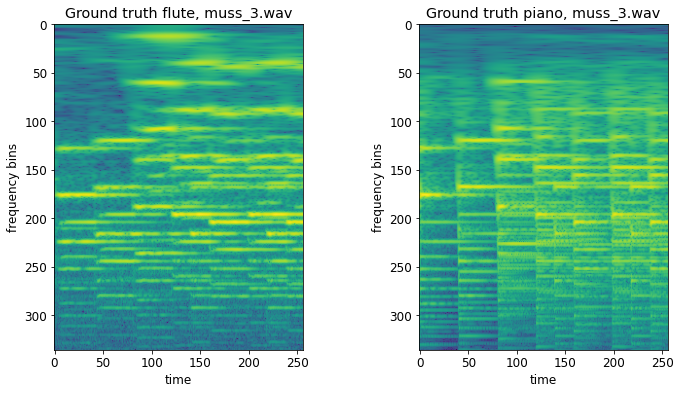

vanillaCycleGan6Res


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


simplifiedTimbreTron


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


timbreTronNoGP


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


timbreTronWithGP


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


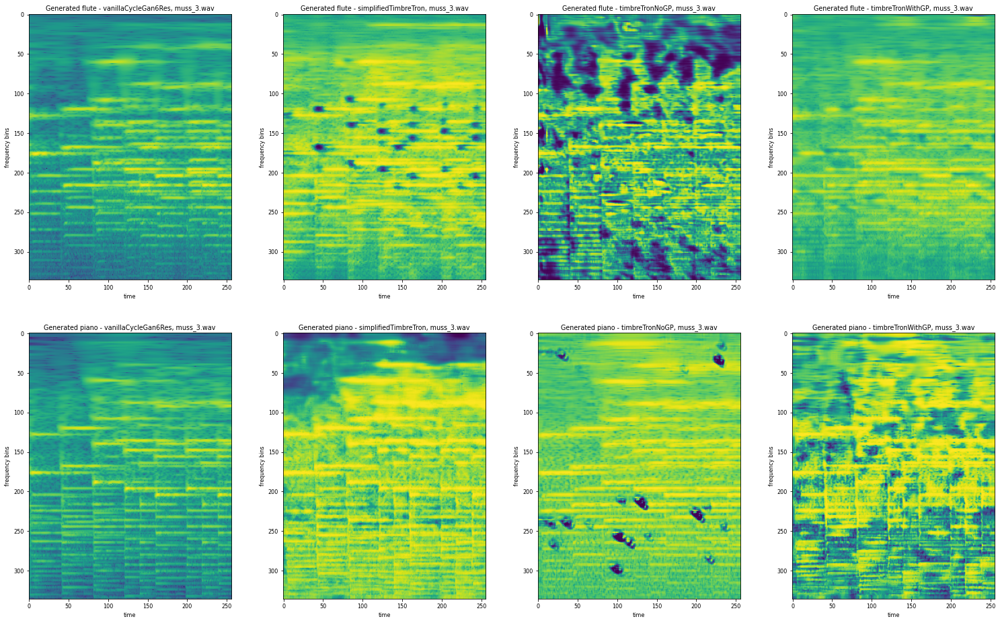

/Users/siddharthsaxena/Documents/Stanford_SCPD/Spring2021/cs230/project/CS230-project/modelEvaluation/../../dataSuperSet/processedData/testSet/flute/wavFiles/mendel_op19_6.wav
/Users/siddharthsaxena/Documents/Stanford_SCPD/Spring2021/cs230/project/CS230-project/modelEvaluation/../../dataSuperSet/processedData/testSet/piano/wavFiles/mendel_op19_6.wav
Performing CQT for flute...
Performing CQT for piano...


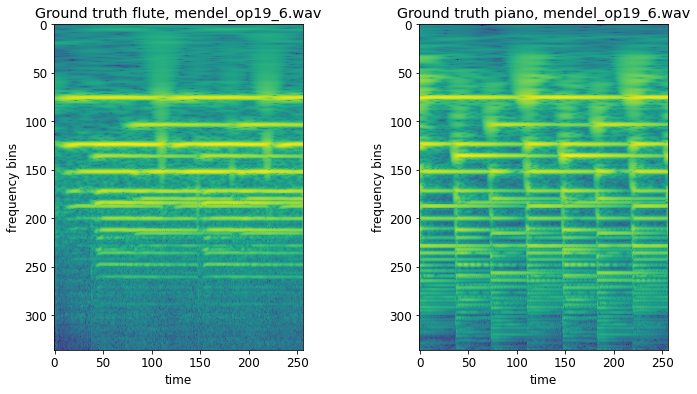

vanillaCycleGan6Res


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


simplifiedTimbreTron


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


timbreTronNoGP


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


timbreTronWithGP


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


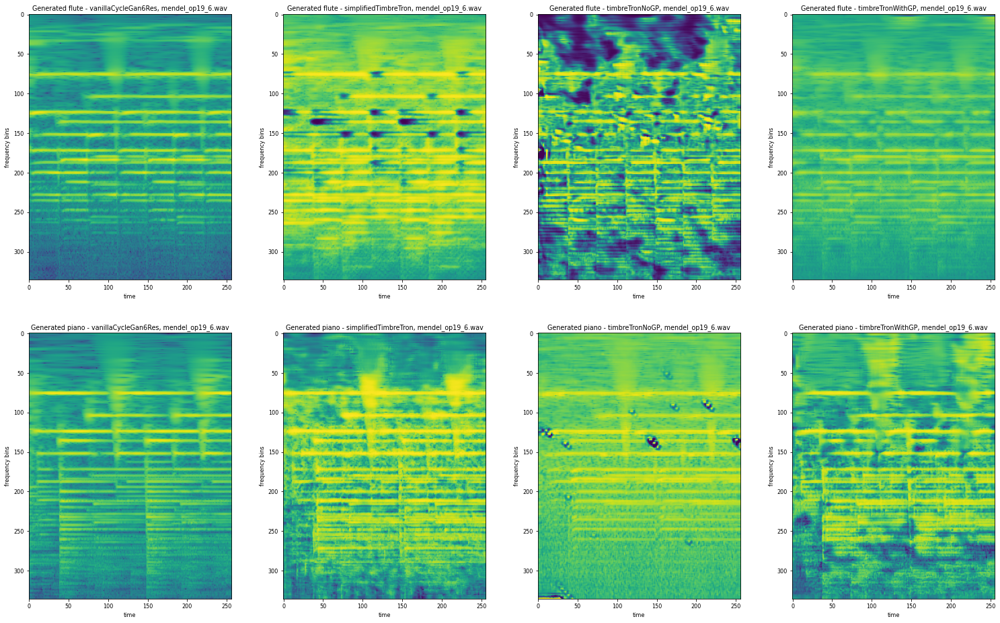

/Users/siddharthsaxena/Documents/Stanford_SCPD/Spring2021/cs230/project/CS230-project/modelEvaluation/../../dataSuperSet/processedData/testSet/flute/wavFiles/liz_rhap02.wav
/Users/siddharthsaxena/Documents/Stanford_SCPD/Spring2021/cs230/project/CS230-project/modelEvaluation/../../dataSuperSet/processedData/testSet/piano/wavFiles/liz_rhap02.wav
Performing CQT for flute...
Performing CQT for piano...


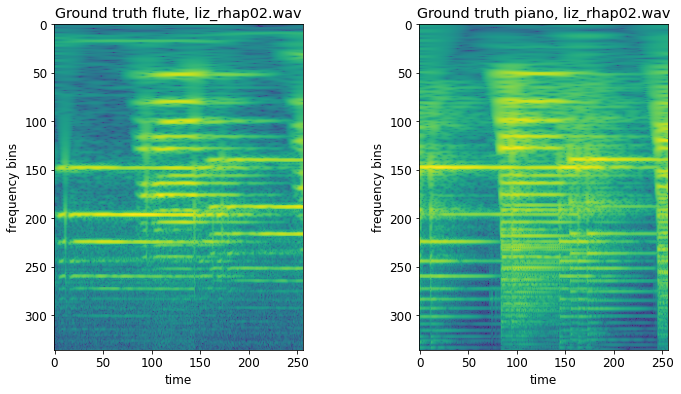

vanillaCycleGan6Res


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


simplifiedTimbreTron


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


timbreTronNoGP


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


timbreTronWithGP


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


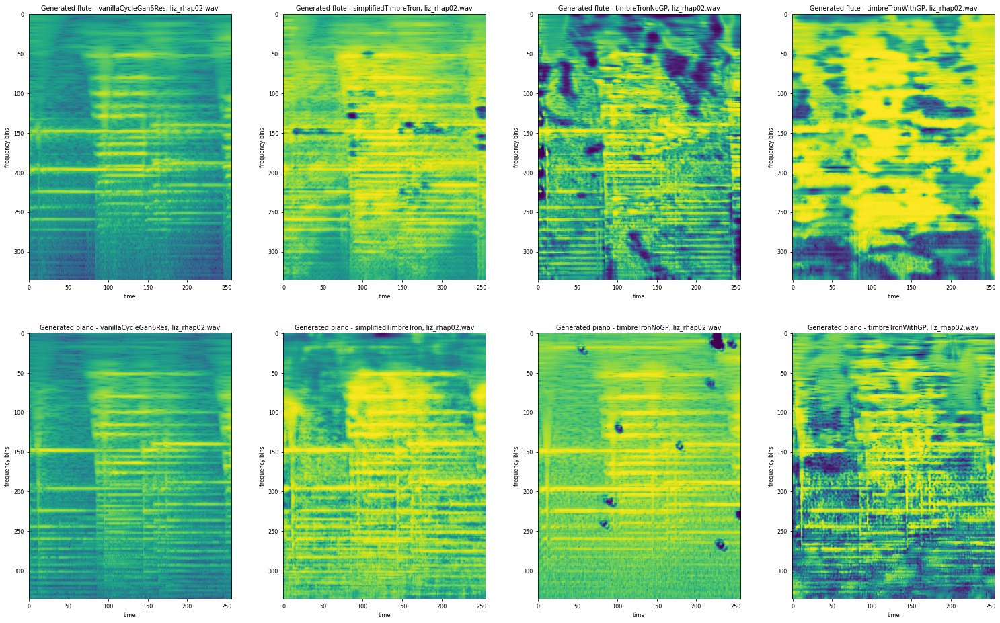

/Users/siddharthsaxena/Documents/Stanford_SCPD/Spring2021/cs230/project/CS230-project/modelEvaluation/../../dataSuperSet/processedData/testSet/flute/wavFiles/schubert_D935_3.wav
/Users/siddharthsaxena/Documents/Stanford_SCPD/Spring2021/cs230/project/CS230-project/modelEvaluation/../../dataSuperSet/processedData/testSet/piano/wavFiles/schubert_D935_3.wav
Performing CQT for flute...
Performing CQT for piano...


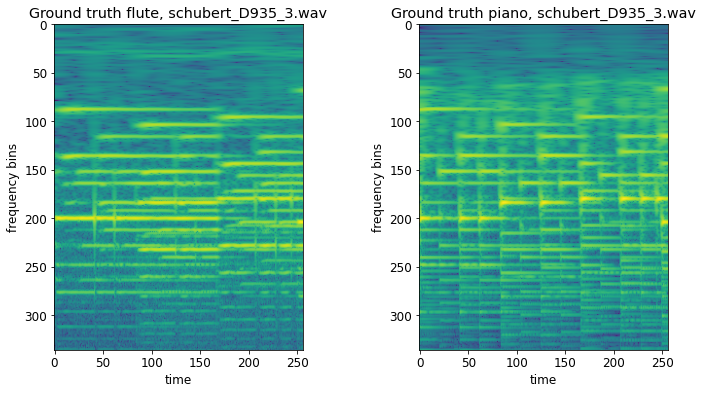

vanillaCycleGan6Res


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


simplifiedTimbreTron


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


timbreTronNoGP


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


timbreTronWithGP


/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(
/Users/siddharthsaxena/opt/anaconda3/lib/python3.8/site-packages/librosa/core/constantq.py:670: UserWarning: hop_length=256 exceeds minimum CQT filter length=213.284.
This will probably cause unpleasant acoustic artifacts. Consider decreasing your hop length or increasing the frequency resolution of your CQT.
  warnings.warn(


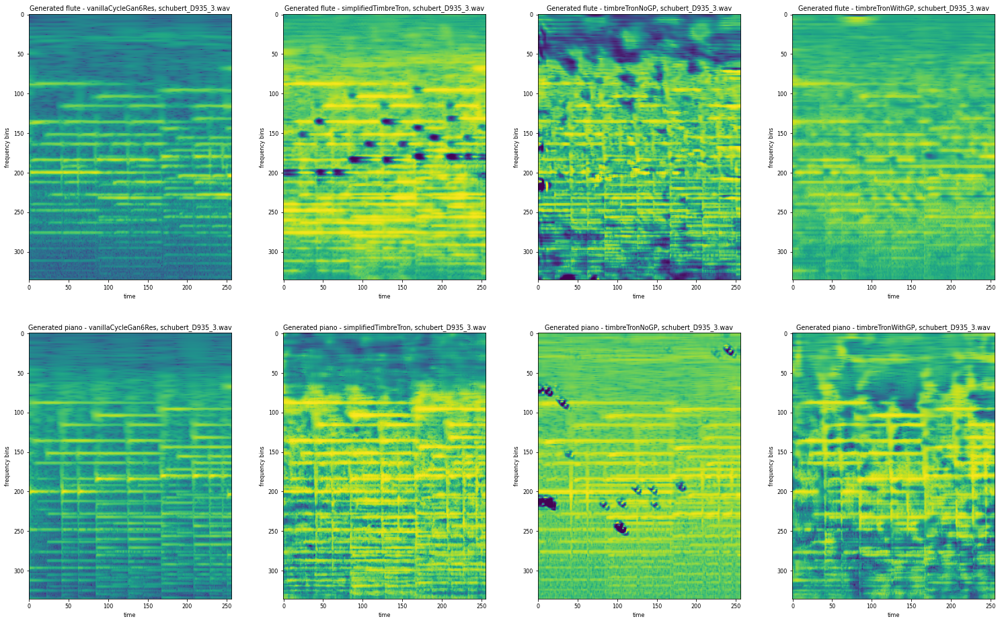

In [118]:
# list of flute wav files in test set

# standardization params
offsetFlute = centerOffset['flute'][STANDARDIZATION_STYLE]
offsetPiano = centerOffset['piano'][STANDARDIZATION_STYLE]

divFlute = divFactor['flute'][STANDARDIZATION_STYLE]
divPiano = divFactor['piano'][STANDARDIZATION_STYLE]
    
fluteSongFileList = glob.glob(f'{fluteTestSongsDir}/*.wav')

for fluteFileName in fluteSongFileList:        
    
    splitArr = fluteFileName.split('/')
    pianoFileName = '/'.join(splitArr[:-3]) + '/piano/' + '/'.join(splitArr[-2:])
    
    print (fluteFileName)
    print (pianoFileName)
    
    print ('Performing CQT for flute...')
    dataFlute, sr = librosa.load(fluteFileName, sr=sr)            
    fluteCqt = librosa.cqt(dataFlute, sr=sr, hop_length = hopLength, n_bins = numBins, bins_per_octave = numBinsPerOctave, filter_scale = filterScale)
    
    print ('Performing CQT for piano...')
    dataPiano, sr = librosa.load(pianoFileName, sr=sr)            
    pianoCqt = librosa.cqt(dataPiano, sr=sr, hop_length = hopLength, n_bins = numBins, bins_per_octave = numBinsPerOctave, filter_scale = filterScale)
    
    # log abs CQT and phase
    fluteCqtLogMag = np.log(np.abs(fluteCqt))
    fluteCqtPhase = np.angle(fluteCqt)
        
    pianoCqtLogMag = np.log(np.abs(pianoCqt))
    pianoCqtPhase = np.angle(pianoCqt)
    
    # plot the ground truth
    mpl.rcParams['figure.figsize'] = [12, 6]
    mpl.rcParams['font.size'] = 12

    # ground truth plots
    fig, ax = plt.subplots(1,2)
    ax[0].imshow(fluteCqtLogMag[:, start : finish])
    ax[0].set(xlabel = 'time', ylabel = 'frequency bins', title = f'Ground truth flute, {splitArr[-1]}')    
    ax[1].imshow(pianoCqtLogMag[:, start : finish])
    ax[1].set(xlabel = 'time', ylabel = 'frequency bins', title = f'Ground truth piano, {splitArr[-1]}')
    
    plt.show(fig)
    plt.close(fig)
    
    # normalize
    fluteCqtLogMagNorm = (fluteCqtLogMag - offsetFlute) / divFlute
    pianoCqtLogMagNorm = (pianoCqtLogMag - offsetPiano) / divPiano 
    
    # generated plots
    mpl.rcParams['figure.figsize'] = [26, 16]
    mpl.rcParams['font.size'] = 8
    fig, ax = plt.subplots(2,len(modelDirDict))
    
    with torch.no_grad():
        
        flute_img = torch.from_numpy(fluteCqtLogMagNorm[None, None, :, start : finish]).to(DEVICE)
        piano_img = torch.from_numpy(pianoCqtLogMagNorm[None, None, :, start : finish]).to(DEVICE)
                
        
        for i, (modelName, modelDir) in enumerate(modelDirDict.items()):
            
            print (modelName)
            
            # generate fake piano and flute
            fake_flute, fake_piano = generatorDict[modelName]['flute'](piano_img).cpu().numpy(), generatorDict[modelName]['piano'](flute_img).cpu().numpy()

            # squeeze extra dims
            fake_flute, fake_piano = np.squeeze(fake_flute), np.squeeze(fake_piano)

            # un-normalize
            fake_flute = fake_flute * divFlute + offsetFlute
            fake_piano = fake_piano * divPiano + offsetPiano
            
            # plot the generated images
            ax[0,i].imshow(fake_flute)
            ax[0,i].set(xlabel = 'time', ylabel = 'frequency bins', title = f'Generated flute - {modelName}, {splitArr[-1]}')
            ax[1,i].imshow(fake_piano)
            ax[1,i].set(xlabel = 'time', ylabel = 'frequency bins', title = f'Generated piano - {modelName}, {splitArr[-1]}')
            
            
            # undo the log
            fake_flute, fake_piano = np.squeeze(np.exp(fake_flute)), np.squeeze(np.exp(fake_piano))
            
            
            # generate complex numbered values for generated CQT transforms
            generatedPianoCqt = fake_piano * np.exp(1j*(fluteCqtPhase[:, start:finish]))
            generatedFluteCqt = fake_flute * np.exp(1j*(pianoCqtPhase[:, start:finish]))

            generatedPianoWav = librosa.icqt(generatedPianoCqt, sr=sr, hop_length = hopLength, bins_per_octave = numBinsPerOctave, filter_scale = filterScale)
            generatedFluteWav = librosa.icqt(generatedFluteCqt, sr=sr, hop_length = hopLength, bins_per_octave = numBinsPerOctave, filter_scale = filterScale)
            
            generatedPianoWavFile = f'{testOutputDir}/generatedPiano_{modelName}_{splitArr[-1]}'
            generatedFluteWavFile = f'{testOutputDir}/generatedFlute_{modelName}_{splitArr[-1]}'
            
            

            sf.write(generatedPianoWavFile, generatedPianoWav, sr, subtype='PCM_24')
            sf.write(generatedFluteWavFile, generatedFluteWav, sr, subtype='PCM_24')
            
            
    groundTruthPianoWavFile = f'{testOutputDir}/groundTruthPiano_{splitArr[-1]}'
    groundTruthFluteWavFile = f'{testOutputDir}/groundTruthFlute_{splitArr[-1]}'
    sf.write(groundTruthPianoWavFile, dataPiano[:int(sr*numSecondsPerChunk)], sr, subtype='PCM_24')
    sf.write(groundTruthFluteWavFile, dataFlute[:int(sr*numSecondsPerChunk)], sr, subtype='PCM_24')

    plt.show(fig)
    plt.close(fig)
            
            
            


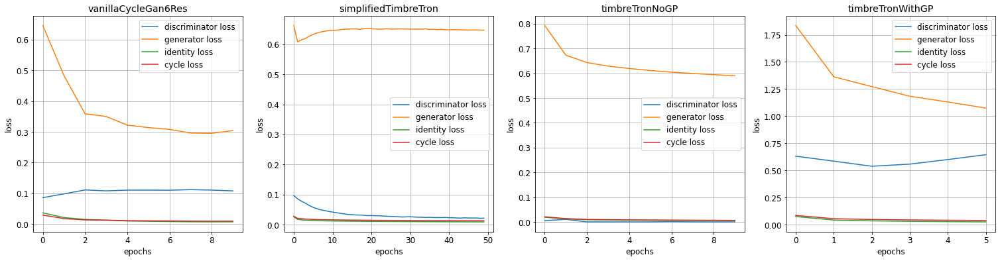

In [114]:
# evaluate loss progressions

mpl.rcParams['figure.figsize'] = [26, 6]
mpl.rcParams['font.size'] = 12

fig, ax = plt.subplots(1, len(modelDirDict))

for i, (modelName, modelDir) in enumerate(modelDirDict.items()):
    
    checkPointDir = f'{modelDir}/checkPoints'
    checkPointLossTrackingDir = f'{checkPointDir}/lossTracking'
    
    discriminatorLossProgression = np.load(f'{checkPointLossTrackingDir}/discriminatorLossProgression__{fileTagDict[modelName]}.npy')
    generatorLossProgression = np.load(f'{checkPointLossTrackingDir}/generatorLossProgression__{fileTagDict[modelName]}.npy')
    identityLossProgression = np.load(f'{checkPointLossTrackingDir}/identityLossProgression__{fileTagDict[modelName]}.npy')
    cycleLossProgression = np.load(f'{checkPointLossTrackingDir}/cycleLossProgression__{fileTagDict[modelName]}.npy')
    
    ax[i].plot(np.arange(len(discriminatorLossProgression)), discriminatorLossProgression, label = 'discriminator loss')
    ax[i].plot(np.arange(len(generatorLossProgression)), generatorLossProgression, label = 'generator loss')
    ax[i].plot(np.arange(len(identityLossProgression)), identityLossProgression, label = 'identity loss')
    ax[i].plot(np.arange(len(cycleLossProgression)), cycleLossProgression, label = 'cycle loss')
    ax[i].grid()
    ax[i].legend()
    ax[i].set(xlabel = 'epochs', ylabel = 'loss', title = f'{modelName}')
    